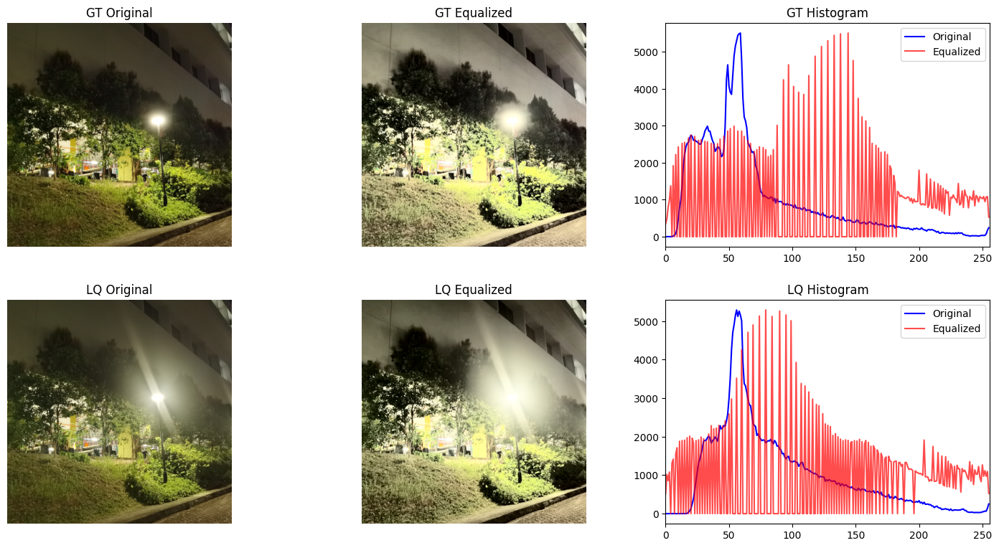

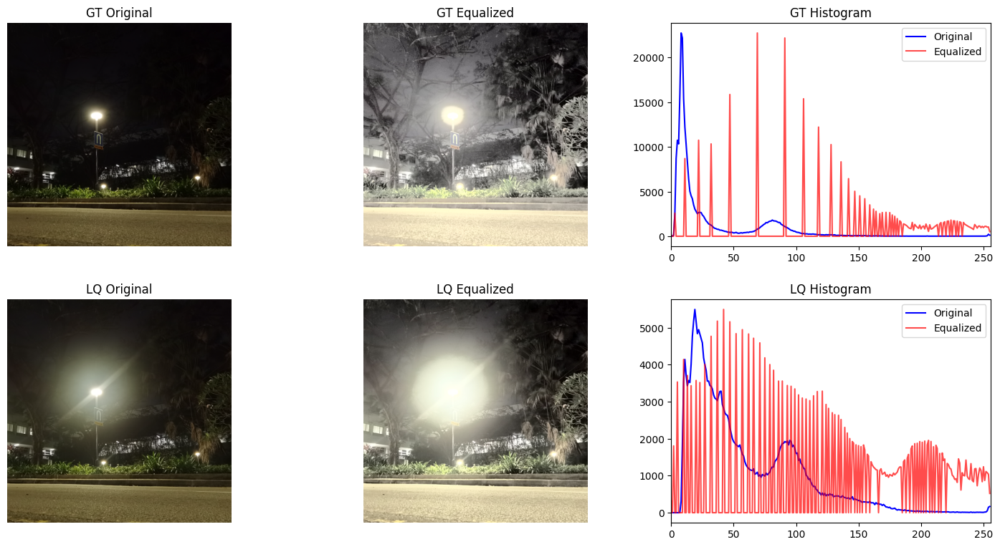

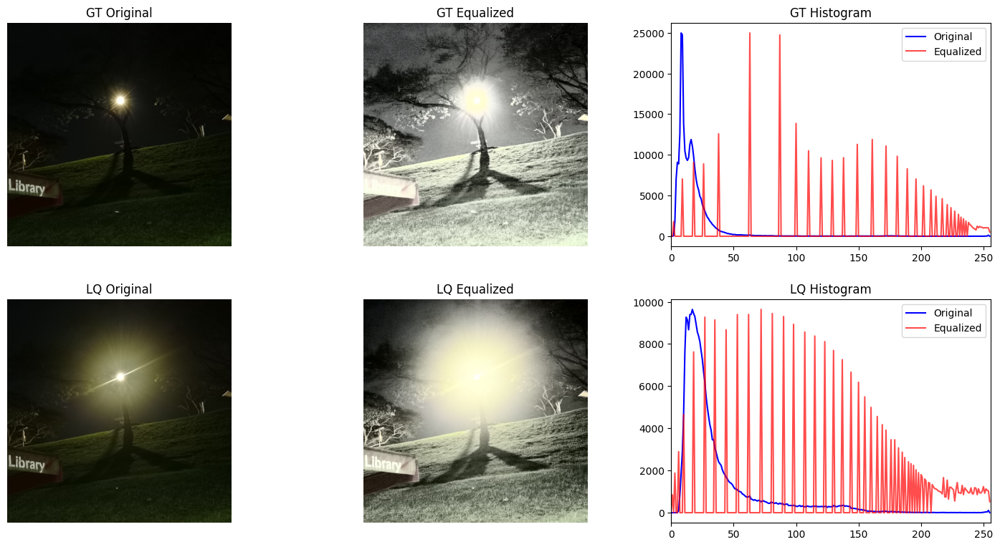

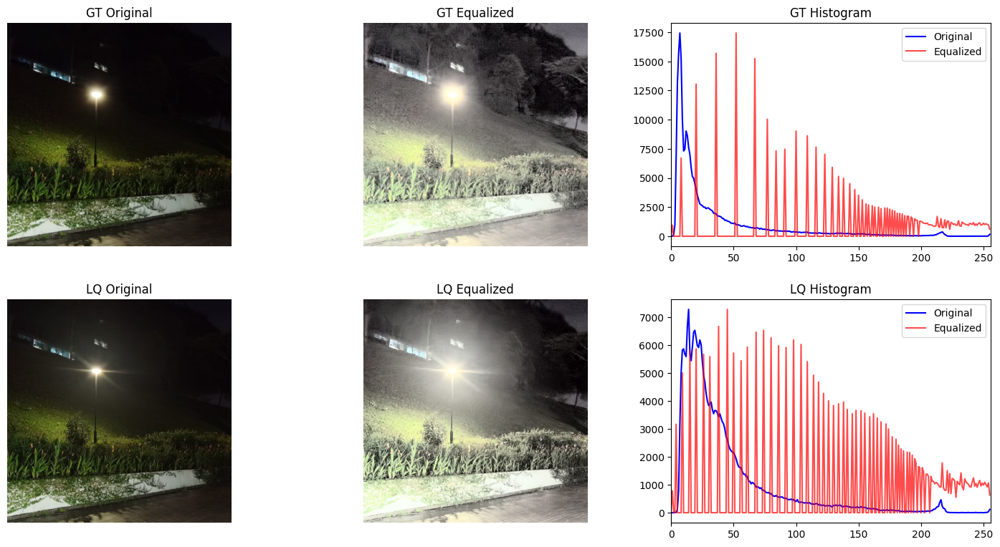

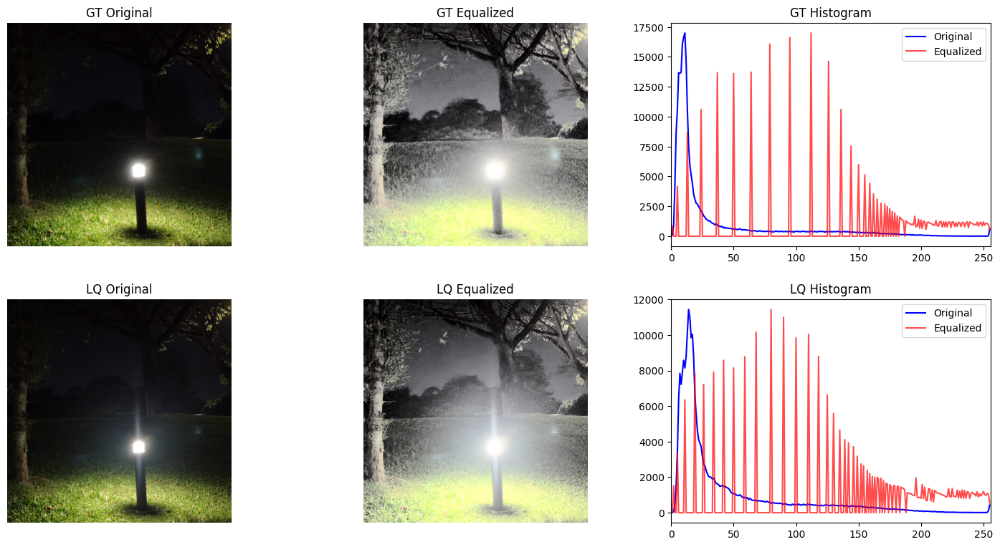

In [1]:
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt

def read_image(path):
    """从本地读取图像，支持彩色和灰度图"""
    image = cv2.imread(path)
    if image is None:
        raise ValueError(f"无法读取图像: {path}")
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # 转换为RGB格式

def histogram_equalization(img):
    """
    对图像进行直方图均衡化
    参数:
        img: 输入图像(RGB或灰度)
    返回:
        equalized_img: 均衡化后的图像
        hist_original: 原始图像直方图
        hist_equalized: 均衡化后直方图
    """
    if len(img.shape) == 3:  # 彩色图像
        # 转换为YCrCb空间，只对Y通道(亮度)进行均衡化
        ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        y = ycrcb[:,:,0]
        
        # 计算原始直方图
        hist_original = cv2.calcHist([y], [0], None, [256], [0,256])
        
        # 均衡化
        y_eq = cv2.equalizeHist(y)
        
        # 合并通道
        ycrcb[:,:,0] = y_eq
        equalized_img = cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2RGB)
        
        # 计算均衡化后直方图
        hist_equalized = cv2.calcHist([y_eq], [0], None, [256], [0,256])
    else:  # 灰度图像
        hist_original = cv2.calcHist([img], [0], None, [256], [0,256])
        equalized_img = cv2.equalizeHist(img)
        hist_equalized = cv2.calcHist([equalized_img], [0], None, [256], [0,256])
    
    return equalized_img, hist_original, hist_equalized

# 读取图像
gt_path = "E:/dataset/Flare7Kpp/test_data/real/gt/gt_000046.png"
lq_path = "E:/dataset/Flare7Kpp/test_data/real/input/input_000046.png"
for i in range(15,20):
    gt_path = f"E:/dataset/Flare7Kpp/test_data/real/gt/gt_0000{i}.png"
    lq_path = f"E:/dataset/Flare7Kpp/test_data/real/input/input_0000{i}.png"
    # gt_path = f"E:/dataset/flare7k_local/gt/c0/{i}.png"
    # lq_path = f"E:/dataset/flare7k_local/input/c0/{i}.png"
    try:
        gt_img = read_image(gt_path)
        lq_img = read_image(lq_path)
        
        # 对两张图像分别进行直方图均衡化
        gt_eq, gt_hist_orig, gt_hist_eq = histogram_equalization(gt_img)
        lq_eq, lq_hist_orig, lq_hist_eq = histogram_equalization(lq_img)
        
        # 创建绘图 (2行3列)，并限制整体图像大小
        fig, axes = plt.subplots(2, 3, figsize=(15, 8))
        
        # 设置图像显示的最大尺寸
        max_display_size = (64, 64)  # 控制显示大小
        
        # 第一行：GT相关结果
        axes[0, 0].imshow(gt_img)
        axes[0, 0].set_title('GT Original')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(gt_eq)
        axes[0, 1].set_title('GT Equalized')
        axes[0, 1].axis('off')
        
        axes[0, 2].plot(gt_hist_orig, color='b', label='Original')
        axes[0, 2].plot(gt_hist_eq, color='r', alpha=0.7, label='Equalized')
        axes[0, 2].set_title('GT Histogram')
        axes[0, 2].legend()
        axes[0, 2].set_xlim([0, 256])
        
        # 第二行：LQ相关结果
        axes[1, 0].imshow(lq_img)
        axes[1, 0].set_title('LQ Original')
        axes[1, 0].axis('off')
        
        axes[1, 1].imshow(lq_eq)
        axes[1, 1].set_title('LQ Equalized')
        axes[1, 1].axis('off')
        
        axes[1, 2].plot(lq_hist_orig, color='b', label='Original')
        axes[1, 2].plot(lq_hist_eq, color='r', alpha=0.7, label='Equalized')
        axes[1, 2].set_title('LQ Histogram')
        axes[1, 2].legend()
        axes[1, 2].set_xlim([0, 256])
        
        # 调整子图间距
        plt.tight_layout(pad=2.0)
        
        # 限制图像显示大小（通过调整figsize实现）
        for ax in axes[:, :2].flatten():  # 只对图像子图进行操作
            ax.set_aspect('equal')
        
        plt.show()
    
    except Exception as e:
        print(f"发生错误: {e}")

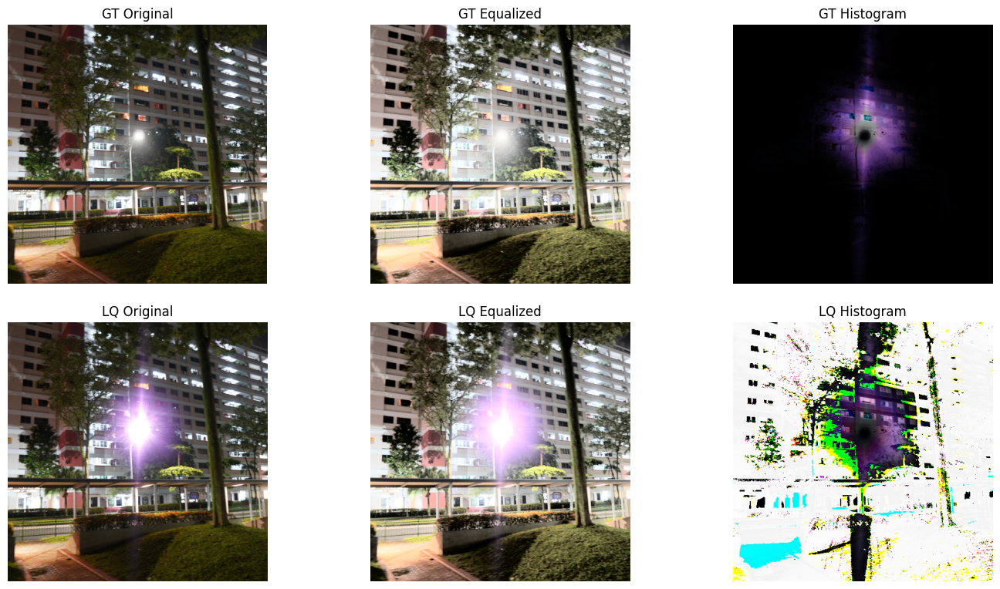

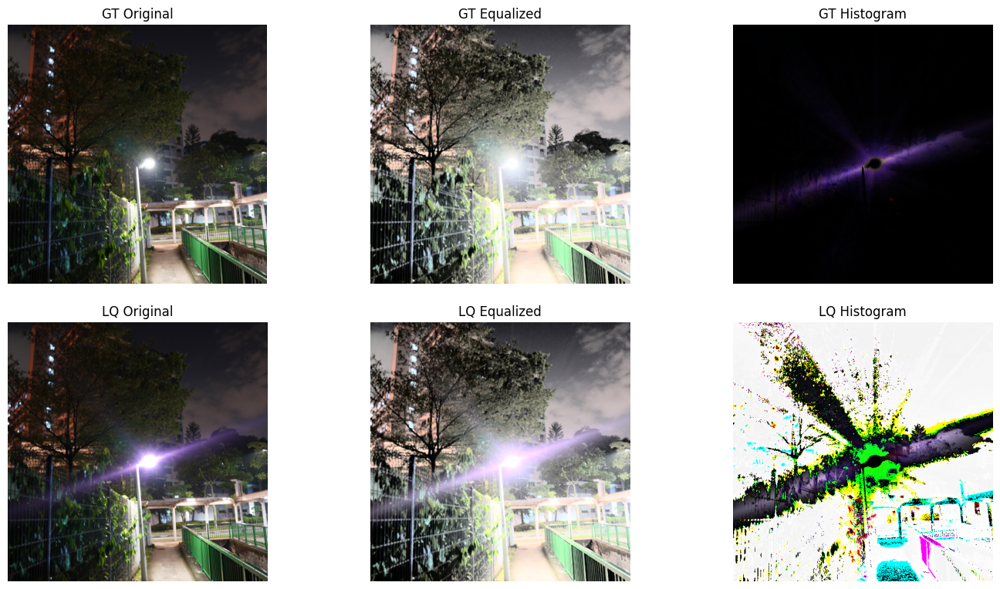

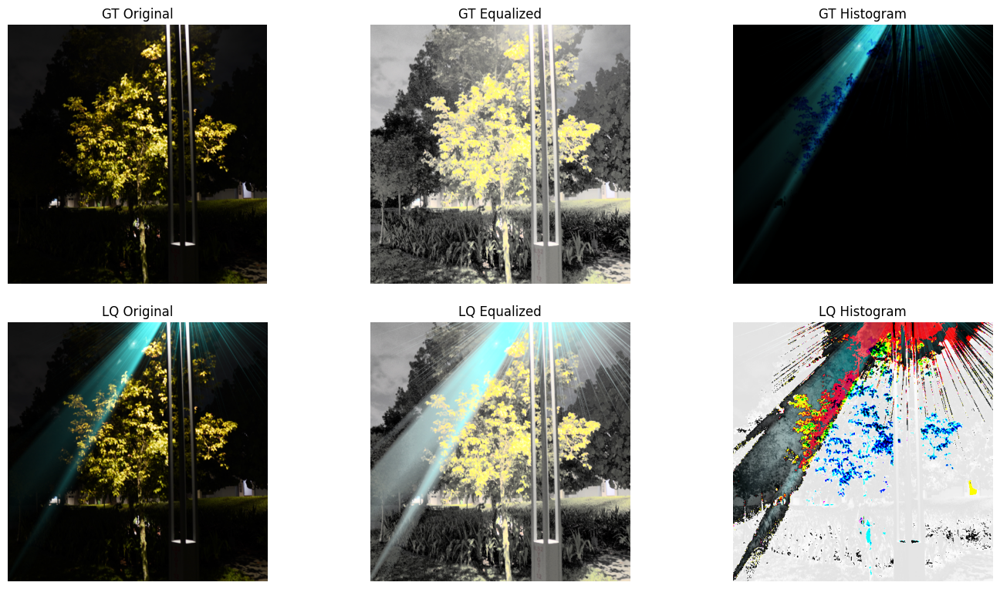

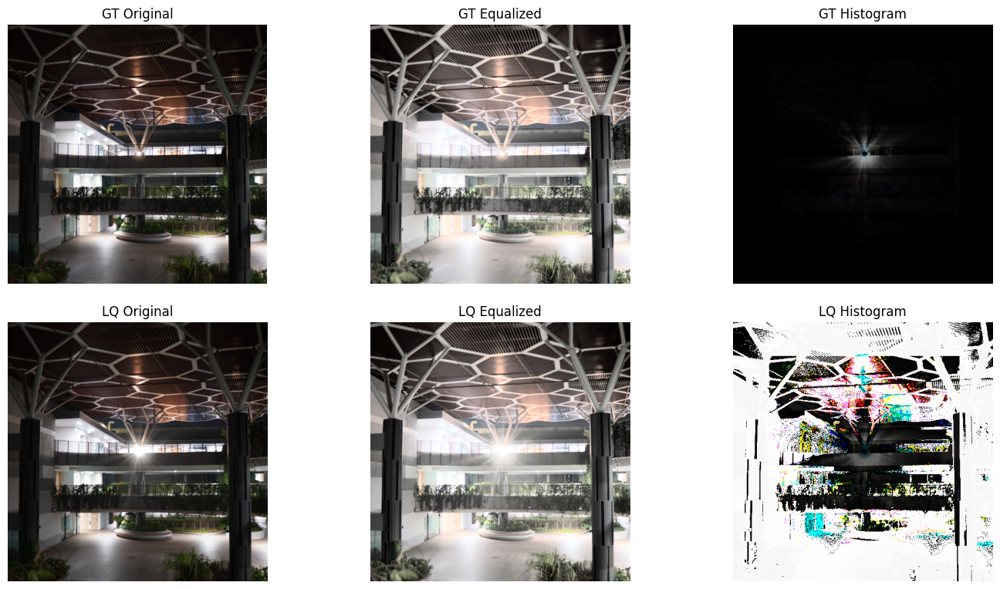

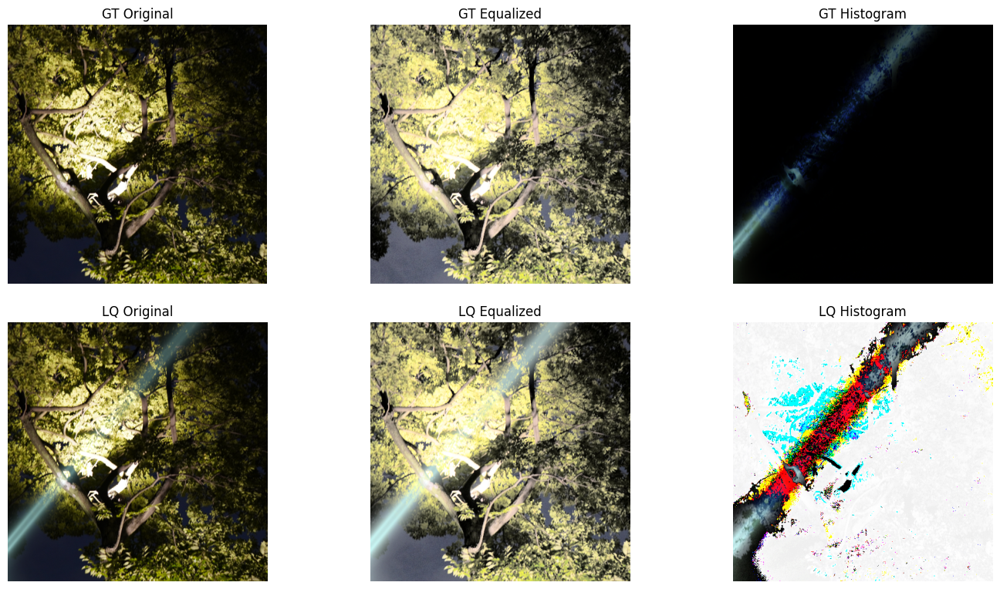

In [12]:
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt

def read_image(path):
    """从本地读取图像，支持彩色和灰度图"""
    image = cv2.imread(path)
    if image is None:
        raise ValueError(f"无法读取图像: {path}")
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # 转换为RGB格式

def histogram_equalization(img):
    """
    对图像进行直方图均衡化
    参数:
        img: 输入图像(RGB或灰度)
    返回:
        equalized_img: 均衡化后的图像
        hist_original: 原始图像直方图
        hist_equalized: 均衡化后直方图
    """
    if len(img.shape) == 3:  # 彩色图像
        # 转换为YCrCb空间，只对Y通道(亮度)进行均衡化
        ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        y = ycrcb[:,:,0]
        
        # 计算原始直方图
        hist_original = cv2.calcHist([y], [0], None, [256], [0,256])
        
        # 均衡化
        y_eq = cv2.equalizeHist(y)
        
        # 合并通道
        ycrcb[:,:,0] = y_eq
        equalized_img = cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2RGB)
        
        # 计算均衡化后直方图
        hist_equalized = cv2.calcHist([y_eq], [0], None, [256], [0,256])
    else:  # 灰度图像
        hist_original = cv2.calcHist([img], [0], None, [256], [0,256])
        equalized_img = cv2.equalizeHist(img)
        hist_equalized = cv2.calcHist([equalized_img], [0], None, [256], [0,256])
    
    return equalized_img, hist_original, hist_equalized

# 读取图像
gt_path = "E:/dataset/Flare7Kpp/test_data/real/gt/gt_000046.png"
lq_path = "E:/dataset/Flare7Kpp/test_data/real/input/input_000046.png"
for i in range(15,20):
    gt_path = f"E:/dataset/Flare7Kpp/test_data/synthetic/gt/gt_0000{i}.png"
    lq_path = f"E:/dataset/Flare7Kpp/test_data/synthetic/input/input_0000{i}.png"
    # gt_path = f"E:/dataset/flare7k_local/gt/c0/{i}.png"
    # lq_path = f"E:/dataset/flare7k_local/input/c0/{i}.png"
    try:
        gt_img = read_image(gt_path)
        lq_img = read_image(lq_path)
        
        # 对两张图像分别进行直方图均衡化
        gt_eq, gt_hist_orig, gt_hist_eq = histogram_equalization(gt_img)
        lq_eq, lq_hist_orig, lq_hist_eq = histogram_equalization(lq_img)
        
        # 创建绘图 (2行3列)，并限制整体图像大小
        fig, axes = plt.subplots(2, 3, figsize=(15, 8))
        
        # 设置图像显示的最大尺寸
        max_display_size = (64, 64)  # 控制显示大小
        
        # 第一行：GT相关结果
        axes[0, 0].imshow(gt_img)
        axes[0, 0].set_title('GT Original')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(gt_eq)
        axes[0, 1].set_title('GT Equalized')
        axes[0, 1].axis('off')
        
        axes[0, 2].imshow(lq_img-gt_img)
        axes[0, 2].set_title('GT Histogram')
        axes[0, 2].axis('off')
        
        # 第二行：LQ相关结果
        axes[1, 0].imshow(lq_img)
        axes[1, 0].set_title('LQ Original')
        axes[1, 0].axis('off')
        
        axes[1, 1].imshow(lq_eq)
        axes[1, 1].set_title('LQ Equalized')
        axes[1, 1].axis('off')
        
        axes[1, 2].imshow(lq_eq-gt_eq)
        axes[1, 2].set_title('LQ Histogram')
        axes[1, 2].axis('off')
        # 
        # 调整子图间距
        plt.tight_layout(pad=2.0)
        
        # 限制图像显示大小（通过调整figsize实现）
        for ax in axes[:, :2].flatten():  # 只对图像子图进行操作
            ax.set_aspect('equal')
        
        plt.show()
    
    except Exception as e:
        print(f"发生错误: {e}")

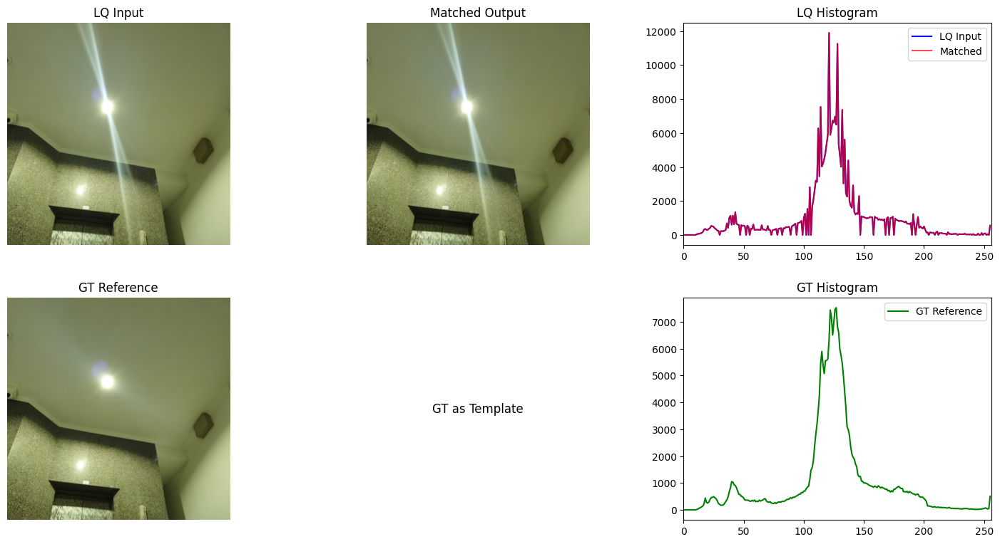

In [6]:
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.exposure import match_histograms

def read_image(path):
    """从本地读取图像，支持彩色和灰度图"""
    image = cv2.imread(path, cv2.IMREAD_COLOR)  # 确保以彩色模式读取
    if image is None:
        raise ValueError(f"无法读取图像: {path}")
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def histogram_matching(lq_img, gt_img):
    """
    以GT为模板对LQ进行直方图匹配
    参数:
        lq_img: 待处理图像 (RGB)
        gt_img: 模板图像 (RGB)
    返回:
        matched_img: 匹配后的图像
        lq_hist: LQ原始直方图
        gt_hist: GT直方图
        matched_hist: 匹配后直方图
    """
    # 确保图像是8位无符号整型
    lq_img = np.uint8(lq_img)
    gt_img = np.uint8(gt_img)
    
    # 彩色图像处理
    if len(lq_img.shape) == 3:
        # 转换为YCrCb空间，仅对亮度通道(Y)进行匹配
        lq_ycrcb = cv2.cvtColor(lq_img, cv2.COLOR_RGB2YCrCb)
        gt_ycrcb = cv2.cvtColor(gt_img, cv2.COLOR_RGB2YCrCb)
        
        # 提取Y通道并确保是uint8类型
        lq_y = np.uint8(lq_ycrcb[:,:,0])
        gt_y = np.uint8(gt_ycrcb[:,:,0])
        
        # 直方图匹配
        matched_y = match_histograms(lq_y, gt_y)
        matched_y = np.uint8(matched_y)  # 确保结果在0-255范围内
        
        # 合并通道
        lq_ycrcb[:,:,0] = matched_y
        matched_img = cv2.cvtColor(lq_ycrcb, cv2.COLOR_YCrCb2RGB)
        
        # 计算直方图 (确保使用正确的参数)
        lq_hist = cv2.calcHist([lq_y], [0], None, [256], [0,256])
        gt_hist = cv2.calcHist([gt_y], [0], None, [256], [0,256])
        matched_hist = cv2.calcHist([np.uint8(matched_y)], [0], None, [256], [0,256])
    else:  # 灰度图像
        lq_img = np.uint8(lq_img)
        gt_img = np.uint8(gt_img)
        matched_img = match_histograms(lq_img, gt_img)
        matched_img = np.uint8(matched_img)
        
        lq_hist = cv2.calcHist([lq_img], [0], None, [256], [0,256])
        gt_hist = cv2.calcHist([gt_img], [0], None, [256], [0,256])
        matched_hist = cv2.calcHist([matched_img], [0], None, [256], [0,256])
    
    return matched_img, lq_hist, gt_hist, matched_hist

# 读取图像
gt_path = "E:/dataset/Flare7Kpp/test_data/real/gt/gt_000046.png"
lq_path = "E:/dataset/Flare7Kpp/test_data/real/input/input_000046.png"

try:
    gt_img = read_image(gt_path)
    lq_img = read_image(lq_path)
    
    # 执行直方图匹配
    matched_img, lq_hist, gt_hist, matched_hist = histogram_matching(lq_img, gt_img)
    
    # 创建绘图 (2行3列)
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))
    
    # 第一行：LQ图像处理流程
    axes[0, 0].imshow(lq_img)
    axes[0, 0].set_title('LQ Input')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(matched_img)
    axes[0, 1].set_title('Matched Output')
    axes[0, 1].axis('off')
    
    axes[0, 2].plot(lq_hist, 'b', label='LQ Input')
    axes[0, 2].plot(matched_hist, 'r', alpha=0.7, label='Matched')
    axes[0, 2].set_title('LQ Histogram')
    axes[0, 2].legend()
    axes[0, 2].set_xlim([0, 256])
    
    # 第二行：GT参考图像
    axes[1, 0].imshow(gt_img)
    axes[1, 0].set_title('GT Reference')
    axes[1, 0].axis('off')
    
    axes[1, 1].axis('off')  # 留空保持对齐
    axes[1, 1].text(0.5, 0.5, 'GT as Template', 
                   ha='center', va='center', fontsize=12)
    
    axes[1, 2].plot(gt_hist, 'g', label='GT Reference')
    axes[1, 2].set_title('GT Histogram')
    axes[1, 2].legend()
    axes[1, 2].set_xlim([0, 256])
    
    plt.tight_layout(pad=2.0)
    plt.show()

except Exception as e:
    print(f"发生错误: {e}")
    print("可能的原因:")
    print("1. 图像路径不正确")
    print("2. 图像格式不支持")
    print("3. 图像数据类型问题")